In [2]:
!brew install graphviz
!pip install torchviz
!pip install scipy
!pip install segmentation-models-pytorch
!pip install pytorch-ignite

/bin/bash: brew: command not found
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=0effc53291771842c0af75d3aa6290af0305fad99567a0ef1359d4731f124f73
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 913.0 kB/s eta 0:00:00 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 14.4 MB/s eta 0:00:0000:0100:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=0e6395c888d276394a3e79cf64a800bdc696ffe9d4ffa81b037aac8f5032e841
  Stored in directory: /root/.cache/pip/

In [3]:
import torch
from torch import nn as NN
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torchdata

import torchvision
from torchvision.transforms import v2 as T
from torchvision import transforms as stdT
from torchvision.models import resnet34
from torchvision.transforms.functional import pil_to_tensor, to_pil_image

from PIL import Image

import os
from enum import Enum
from dataclasses import dataclass, field
from typing import List

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from torchviz import make_dot
from typing import List, Tuple
import json

import warnings
warnings.filterwarnings('ignore')

from scipy.spatial.distance import euclidean, minkowski
import segmentation_models_pytorch as smp

from ignite.engine import *
from ignite.handlers import *
from ignite.metrics import *
from ignite.metrics.regression import *
from ignite.utils import *



# Classes

In [4]:
@dataclass
class TrainResults:
    model_name: str
    train_losses: List[float] = field(default_factory=list)
    test_losses:  List[float] = field(default_factory=list)


# Values

In [5]:
@dataclass(frozen=True)
class Pathes:
    pairs_path: str = '/kaggle/input/semantic-drone-dataset/class_dict_seg.csv'
    masks_path_rgb: str = '/kaggle/input/semantic-drone-dataset/RGB_color_image_masks/RGB_color_image_masks/'
    masks_path: str = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/'
    images_path: str = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'
    processed_data_x_path: str = '/kaggle/input/clusterupdate/processed_data_x/processed_data_x/'
    processed_data_y_path: str = '/kaggle/input/clusterupdate/processed_data_y/processed_data_y/'


In [6]:
images_list_x = sorted(os.listdir(Pathes.processed_data_x_path))
images_list_y = sorted(os.listdir(Pathes.processed_data_y_path))

In [7]:
clusters = pd.read_csv(Pathes.pairs_path, index_col=0)
clusters

,r,g,b
name,,,
unlabeled,0,0,0
paved-area,128,64,128
dirt,130,76,0
grass,0,102,0
gravel,112,103,87
water,28,42,168
rocks,48,41,30
pool,0,50,89
vegetation,107,142,35


In [8]:
@dataclass(frozen=True)
class Parameters:
    batch_size: int = 32
    test_size: float = 0.2
    epochs: int = 150
    image_n_chanels: int = 3
    image_height: int=256
    image_width: int=256
    treshold_for_cluster = 0.21
    num_of_clusters: int = len(clusters)
    image_shape: Tuple[int, int] = (256, 256)

# Functions

In [9]:
def test_validation(model: torch.nn.Module, test_dataset: Dataset, device=0):
    for x, y in test_dataset:
        y_p = model(x.unsqueeze(0).to(device))
        

In [10]:
def save_train_res(model: torch.nn.Module, train_data: TrainResults):
    torch.save(model.state_dict(), f'{train_data.model_name}.pt')
    with open(f'./{train_data.model_name}.json', 'w') as f:
        json.dump(train_data.__dict__, f)

# Create datasets

In [11]:
X_train, X_test, y_train, y_test = train_test_split(images_list_x, images_list_y, test_size=0.2)

In [12]:
class CassavaLeafDiseaseDataset(Dataset):
    def __init__(self, X: List[str], y: List[str], transformations=None):
        self.X = [torch.load(Pathes.processed_data_x_path + i) for i in tqdm(X, desc='load x')]
        self.y = [torch.load(Pathes.processed_data_y_path + i) for i in tqdm(X, desc='load y')]
        self.size = len(self.X)
        self.transformations = transformations
        self.norm = stdT.Normalize([0, 0, 0], [1, 1, 1])
        
    def __len__(self):
        return self.size
    
    def __getitem__(self, idx):
        image, mask = self.norm(self.X[idx].float()), self.y[idx].float()
        if self.transformations != None:
            state = torch.get_rng_state()
            ti = self.transformations(image)
            torch.set_rng_state(state)
            tm = self.transformations(mask)
            ti.requirs_grad = True
            tm.requirs_grad = True
            return ti, tm
        image.requirs_grad = True
        mask.requirs_grad = True
        return image, mask       

In [13]:
transformations = T.Compose([
#     T.Resize((Parameters.image_height, Parameters.image_width),antialias=False),
#     T.Normalize([0, 0, 0], [1, 1, 1]),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomPerspective(distortion_scale=0.2),
    T.RandomRotation(degrees=10),
#     T.ElasticTransform(alpha=50.0), 
#     T.RandomEqualize(),
#     T.RandomSolarize(threshold=225.0),
#     T.RandomPosterize(bits=3)
])

# ransformations_test = T.Compose([
# #     T.Resize((Parameters.image_height, Parameters.image_width)),
# ])

In [14]:
train_dataset = CassavaLeafDiseaseDataset(X_train, y_train, transformations)
test_dataset = CassavaLeafDiseaseDataset(X_test, y_test)
train_dataloader = DataLoader(train_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)

load y: 100%|██████████| 80/80 [00:04<00:00, 18.18it/s]


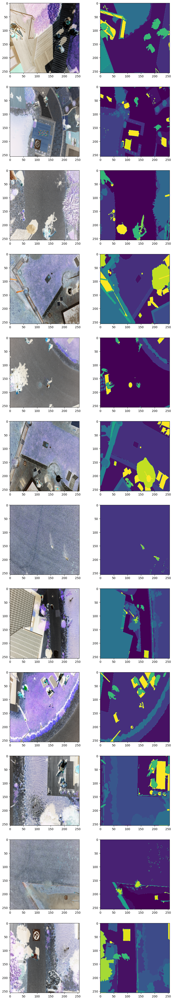

In [22]:
img_x, img_y = [], []
k = 0
for x, y in test_dataset:
    img_x.append(to_pil_image(x))
    img_y.append(y.argmax(0).numpy())
    if k > 10:
        break
    else:
        k += 1
        
f, a = plt.subplots(len(img_x), 2, figsize=(10, 5*len(img_x)))
for i, (x_i, y_i) in enumerate(zip(img_x, img_y)):
    a[i, 0].imshow(x_i)
    a[i, 1].imshow(y_i)
    

# Unet

In [163]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=24)
unet

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [164]:
for i in unet.parameters():
    i.requires_grad = False

for i in unet.segmentation_head.parameters():
    i.requires_grad = True

for i in unet.decoder.blocks[-1].parameters():
    i.requires_grad = True

for i in unet.decoder.blocks[-2].parameters():
    i.requires_grad = True

    
unet = unet.to(0)

In [192]:
criterion = NN.MSELoss()
optimizer = optim.Adam(unet.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 0.01 * 0.975 ** epoch)

In [179]:
train_process = TrainResults('unet')
loss_m = []
valid_loss_mean = []
valid_loss = []valid_loss = []

In [193]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = unet(xb.to(0))
    loss = criterion(outputs, yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 70:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = unet(xb.to(0))
            loss = criterion(outputs, yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(unet, train_process)

  1%|          | 1/150 [00:11<28:36, 11.52s/it]

0 avg_loss= 0.03429276182554489 last_loss =  0.02098940871655941 min_loss =  0.016657354310154915
0 int_loss_m__mean =  0.018253856152296067 int_loss_m__min =  0.017508268356323242
0 int_loss_m__mean =  0.04307500660539635 int_loss_m__min =  0.02098940871655941


  7%|▋         | 11/150 [01:49<23:44, 10.25s/it]

10 avg_loss= 0.03377772698783798 last_loss =  0.024194559082388878 min_loss =  0.01662938855588436
10 int_loss_m__mean =  0.01820380948483944 int_loss_m__min =  0.01760546676814556
10 int_loss_m__mean =  0.042455758433789015 int_loss_m__min =  0.02098940871655941


 14%|█▍        | 21/150 [03:26<21:58, 10.22s/it]

20 avg_loss= 0.0332898881518488 last_loss =  0.02119978331029415 min_loss =  0.016499696299433708
20 int_loss_m__mean =  0.017852917686104773 int_loss_m__min =  0.016499696299433708
20 int_loss_m__mean =  0.041836341843008995 int_loss_m__min =  0.02098940871655941


 21%|██        | 31/150 [05:03<20:06, 10.14s/it]

30 avg_loss= 0.03282551884178489 last_loss =  0.021759655326604843 min_loss =  0.016019055619835854
30 int_loss_m__mean =  0.0177180215716362 int_loss_m__min =  0.017206771299242973
30 int_loss_m__mean =  0.04125465077402837 int_loss_m__min =  0.02098940871655941


 27%|██▋       | 41/150 [06:41<18:25, 10.14s/it]

40 avg_loss= 0.032384998255199 last_loss =  0.02242887392640114 min_loss =  0.016019055619835854
40 int_loss_m__mean =  0.01772594228386879 int_loss_m__min =  0.01708633452653885
40 int_loss_m__mean =  0.040714028477668765 int_loss_m__min =  0.02098940871655941


 34%|███▍      | 51/150 [08:18<16:43, 10.13s/it]

50 avg_loss= 0.03196667022578567 last_loss =  0.021229039877653122 min_loss =  0.015673313289880753
50 int_loss_m__mean =  0.01771336868405342 int_loss_m__min =  0.017190707847476006
50 int_loss_m__mean =  0.04019238595436844 int_loss_m__min =  0.02098940871655941


 41%|████      | 61/150 [09:56<14:57, 10.09s/it]

60 avg_loss= 0.03156872533798383 last_loss =  0.020982516929507256 min_loss =  0.015673313289880753
60 int_loss_m__mean =  0.01753624454140663 int_loss_m__min =  0.016722217202186584
60 int_loss_m__mean =  0.03968917948470728 int_loss_m__min =  0.020982516929507256


 47%|████▋     | 71/150 [11:34<13:26, 10.21s/it]

70 avg_loss= 0.031188868734272665 last_loss =  0.026385856792330742 min_loss =  0.015297438949346542
70 int_loss_m__mean =  0.017431318387389184 int_loss_m__min =  0.016908593475818634
70 int_loss_m__mean =  0.039266662231009254 int_loss_m__min =  0.02088119089603424


 54%|█████▍    | 81/150 [13:12<11:48, 10.27s/it]

80 avg_loss= 0.030828000309820875 last_loss =  0.024503624066710472 min_loss =  0.015297438949346542
80 int_loss_m__mean =  0.017343222722411157 int_loss_m__min =  0.016341563314199448
80 int_loss_m__mean =  0.038854814015137844 int_loss_m__min =  0.02088119089603424


 61%|██████    | 91/150 [14:51<10:12, 10.37s/it]

90 avg_loss= 0.030481450827053898 last_loss =  0.019577931612730026 min_loss =  0.015172935090959072
90 int_loss_m__mean =  0.017385407537221908 int_loss_m__min =  0.016344904899597168
90 int_loss_m__mean =  0.038407805887982246 int_loss_m__min =  0.019577931612730026


 67%|██████▋   | 101/150 [16:30<08:26, 10.34s/it]

100 avg_loss= 0.030149674856398915 last_loss =  0.020369721576571465 min_loss =  0.015172935090959072
100 int_loss_m__mean =  0.01692967340350151 int_loss_m__min =  0.016083354130387306
100 int_loss_m__mean =  0.03798866851209867 int_loss_m__min =  0.019577931612730026


 74%|███████▍  | 111/150 [18:08<06:42, 10.32s/it]

110 avg_loss= 0.029833927290591155 last_loss =  0.026460081338882446 min_loss =  0.015172935090959072
110 int_loss_m__mean =  0.01722259521484375 int_loss_m__min =  0.016426701098680496
110 int_loss_m__mean =  0.0376514014787972 int_loss_m__min =  0.019577931612730026


 81%|████████  | 121/150 [19:47<04:56, 10.22s/it]

120 avg_loss= 0.02953098389339985 last_loss =  0.023919574916362762 min_loss =  0.015172935090959072
120 int_loss_m__mean =  0.017310291528701782 int_loss_m__min =  0.016257764771580696
120 int_loss_m__mean =  0.03730395074587229 int_loss_m__min =  0.019577931612730026


 87%|████████▋ | 131/150 [21:26<03:15, 10.27s/it]

130 avg_loss= 0.02924285887626028 last_loss =  0.023397160694003105 min_loss =  0.015172935090959072
130 int_loss_m__mean =  0.016908083483576773 int_loss_m__min =  0.01648140698671341
130 int_loss_m__mean =  0.036959424149245024 int_loss_m__min =  0.019577931612730026


 94%|█████████▍| 141/150 [23:04<01:31, 10.14s/it]

140 avg_loss= 0.028965005336451827 last_loss =  0.021108295768499374 min_loss =  0.015172935090959072
140 int_loss_m__mean =  0.017152263224124907 int_loss_m__min =  0.016339726746082306
140 int_loss_m__mean =  0.036612458258039424 int_loss_m__min =  0.019577931612730026


100%|██████████| 150/150 [24:31<00:00,  9.81s/it]


END avg_loss= 0.02872129884445005 last_loss =  0.016959872096776962 min_loss =  0.015108133666217327


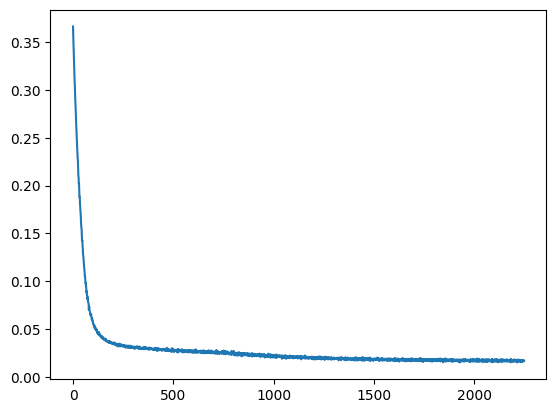

In [195]:
plt.plot(loss_m)

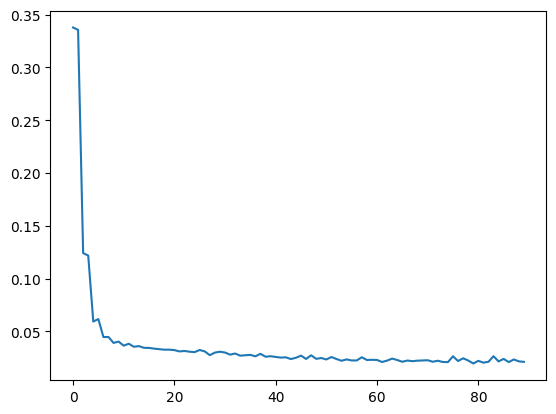

In [197]:
plt.plot(valid_loss)

In [198]:
save_train_res(unet, train_process)

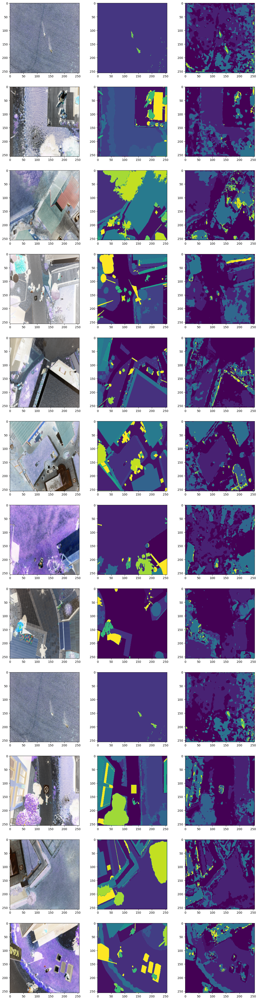

In [199]:
img_x, img_y, pred = [], [], []
k = 0
for x, y in test_dataset:
    img_x.append(to_pil_image(x))
    img_y.append(y.argmax(0).numpy())
    pred.append(unet(x.to(0).unsqueeze(0)).squeeze(0).argmax(0).to('cpu').numpy())
    
    if k > 10:
        break
    else:
        k += 1
        
f, a = plt.subplots(len(img_x), 3, figsize=(15, 5*len(img_x)))
for i, (x_i, y_i, p_i) in enumerate(zip(img_x, img_y, pred)):
    a[i, 0].imshow(x_i)
    a[i, 1].imshow(y_i)
    a[i, 2].imshow(p_i)
    

In [215]:
img_y, pred = [], []
k = 0
for x, y in test_dataset:
    img_y.append(y.unsqueeze(0))
    pred.append(unet(x.to(0).unsqueeze(0)))

In [216]:
yt = torch.cat(img_y, 0)
yp = torch.cat(pred, 0)

In [223]:
yp.shape, yt.shape

(torch.Size([80, 24, 256, 256]), torch.Size([80, 24, 256, 256]))

Метрика IoU для Unet 

In [239]:

def eval_step(engine, batch):
    return batch

default_evaluator = Engine(eval_step)
cm = mc.ConfusionMatrix(num_classes=24)
metric = mc.IoU(cm)
metric.attach(default_evaluator, 'iou')

state = default_evaluator.run([[yp.reshape(-1, 24).to(0), yt.argmax(1).reshape(-1).to(0)]])
print(state.metrics['iou'])

tensor([0.0002, 0.0431, 0.0174, 0.0339, 0.0264, 0.0147, 0.0077, 0.0072, 0.0251,
        0.0233, 0.0153, 0.0049, 0.0004, 0.0068, 0.0021, 0.0089, 0.0009, 0.0051,
        0.0014, 0.0175, 0.0093, 0.0020, 0.0223, 0.0000], dtype=torch.float64)


In [243]:
pd.DataFrame({'Cluster': clusters.index, 'Value': state.metrics['iou']})

,Cluster,Value
0,unlabeled,0.000186
1,paved-area,0.043128
2,dirt,0.017376
3,grass,0.033859
4,gravel,0.026356
5,water,0.014706
6,rocks,0.007657
7,pool,0.007156
8,vegetation,0.025089
9,roof,0.023343


# Resnet50

In [15]:
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights

In [79]:
weights = FCN_ResNet50_Weights.DEFAULT
pretransforms = weights.transforms(resize_size=None)

rn50 = fcn_resnet50(weights=weights, progress=False)
rn50 = rn50.eval()


In [17]:
rn50

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

In [80]:
rn50.classifier[4] = torch.nn.Conv2d(512, Parameters.num_of_clusters, kernel_size=(1, 1), stride=(1, 1))
# rn50.aux_classifier[4] = torch.nn.Conv2d(512, Parameters.num_of_clusters, kernel_size=(1, 1), stride=(1, 1))
for i in rn50.parameters():
    i.requires_grad = False
for i in rn50.classifier.parameters():
    i.requires_grad = True
for i in rn50.backbone.layer4.parameters():
    i.requires_grad = True
rn50 = torch.nn.DataParallel(rn50, device_ids=[0, 1])
rn50 = rn50.to(0)   

In [81]:
criterion = NN.MSELoss()
optimizer = optim.Adam(rn50.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 0.001 * 0.975 ** epoch)

In [82]:
train_process = TrainResults('rn50')
loss_m = []
valid_loss_mean = []
valid_loss = []

In [ ]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = rn50(pretransforms(xb).to(1))['out']
    loss = criterion(outputs.to(1), yb.float().to(1))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 70:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = rn50(pretransforms(xb).to(1))['out']
            loss = criterion(outputs, yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(rn50, train_process)

  1%|          | 1/150 [00:12<32:05, 12.92s/it]

0 avg_loss= 1355.9053466796875 last_loss =  729.9515380859375 min_loss =  752.9573974609375
0 int_loss_m__mean =  1355.9053466796875 int_loss_m__min =  752.9573974609375
0 int_loss_m__mean =  705.9372151692709 int_loss_m__min =  663.496826171875


  7%|▋         | 11/150 [02:09<27:45, 11.98s/it]

10 avg_loss= 195.4748978181319 last_loss =  16.05799102783203 min_loss =  15.443229675292969
10 int_loss_m__mean =  17.782026100158692 int_loss_m__min =  15.443229675292969
10 int_loss_m__mean =  361.67922496795654 int_loss_m__min =  16.05799102783203


 14%|█▍        | 21/150 [04:05<25:51, 12.03s/it]

20 avg_loss= 108.12836759203957 last_loss =  8.786523818969727 min_loss =  8.59692668914795
20 int_loss_m__mean =  9.27568826675415 int_loss_m__min =  8.706001281738281
20 int_loss_m__mean =  244.23792235056558 int_loss_m__min =  8.786523818969727


 21%|██        | 31/150 [06:02<23:53, 12.04s/it]

30 avg_loss= 75.61097515475366 last_loss =  6.1906561851501465 min_loss =  5.636573314666748
30 int_loss_m__mean =  6.030291748046875 int_loss_m__min =  5.636573314666748
30 int_loss_m__mean =  184.7521663506826 int_loss_m__min =  6.049874782562256


 27%|██▋       | 41/150 [08:00<21:53, 12.05s/it]

40 avg_loss= 58.40214339814535 last_loss =  4.2682719230651855 min_loss =  3.706329822540283
40 int_loss_m__mean =  4.34642333984375 int_loss_m__min =  3.706329822540283
40 int_loss_m__mean =  148.68888788223268 int_loss_m__min =  4.2682719230651855


 34%|███▍      | 51/150 [09:56<19:51, 12.04s/it]

50 avg_loss= 47.68585436718136 last_loss =  4.0102949142456055 min_loss =  3.0326004028320312
50 int_loss_m__mean =  3.345682883262634 int_loss_m__min =  3.0326004028320312
50 int_loss_m__mean =  124.49394908216264 int_loss_m__min =  3.2233493328094482


 41%|████      | 61/150 [11:53<17:53, 12.06s/it]

60 avg_loss= 40.342614452956155 last_loss =  2.7327589988708496 min_loss =  2.372774839401245
60 int_loss_m__mean =  2.586204504966736 int_loss_m__min =  2.372774839401245
60 int_loss_m__mean =  107.09072680700393 int_loss_m__min =  2.5883514881134033


 47%|████▋     | 71/150 [13:49<15:43, 11.94s/it]

70 avg_loss= 34.98956615353974 last_loss =  2.088526487350464 min_loss =  1.9400453567504883
70 int_loss_m__mean =  2.139084494113922 int_loss_m__min =  1.964638113975525
70 int_loss_m__mean =  93.97436462839444 int_loss_m__min =  2.064846992492676


 54%|█████▍    | 81/150 [15:46<13:52, 12.07s/it]

80 avg_loss= 30.913071410008417 last_loss =  1.8607308864593506 min_loss =  1.5490362644195557
80 int_loss_m__mean =  1.8400840640068055 int_loss_m__min =  1.5490362644195557
80 int_loss_m__mean =  83.7393255410371 int_loss_m__min =  1.822805643081665


 61%|██████    | 91/150 [17:43<11:59, 12.19s/it]

90 avg_loss= 27.70320234023608 last_loss =  1.5877189636230469 min_loss =  1.307063341140747
90 int_loss_m__mean =  1.604529571533203 int_loss_m__min =  1.4622774124145508
90 int_loss_m__mean =  75.5271136800448 int_loss_m__min =  1.5877189636230469


 67%|██████▋   | 101/150 [19:40<09:51, 12.08s/it]

100 avg_loss= 25.108389165968 last_loss =  1.6261247396469116 min_loss =  1.2298438549041748
100 int_loss_m__mean =  1.4113082766532898 int_loss_m__min =  1.2298438549041748
100 int_loss_m__mean =  68.79508631879634 int_loss_m__min =  1.351587176322937


 74%|███████▍  | 111/150 [21:37<07:48, 12.00s/it]

110 avg_loss= 22.967057823597848 last_loss =  1.1462925672531128 min_loss =  1.0716084241867065
110 int_loss_m__mean =  1.2817104935646058 int_loss_m__min =  1.1139566898345947
110 int_loss_m__mean =  63.16816011071205 int_loss_m__min =  1.1462925672531128


 81%|████████  | 121/150 [23:33<05:46, 11.96s/it]

120 avg_loss= 21.169299210398652 last_loss =  1.2607167959213257 min_loss =  1.010737657546997
120 int_loss_m__mean =  1.166800284385681 int_loss_m__min =  1.023328185081482
120 int_loss_m__mean =  58.401247969040504 int_loss_m__min =  1.057039737701416


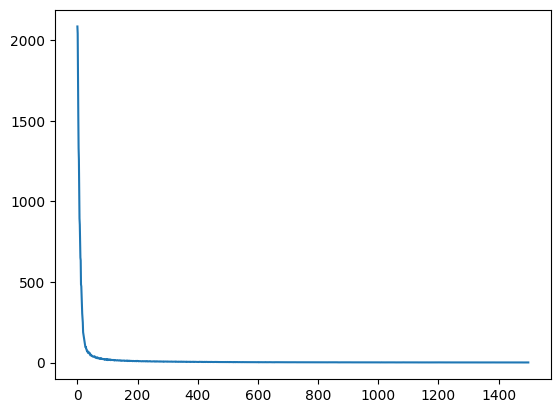

In [84]:
plt.plot(loss_m)

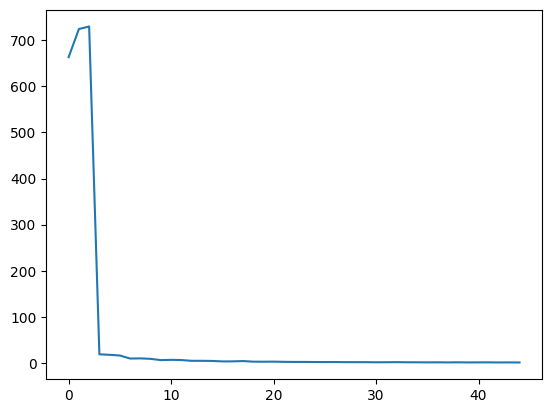

In [85]:
plt.plot(valid_loss)

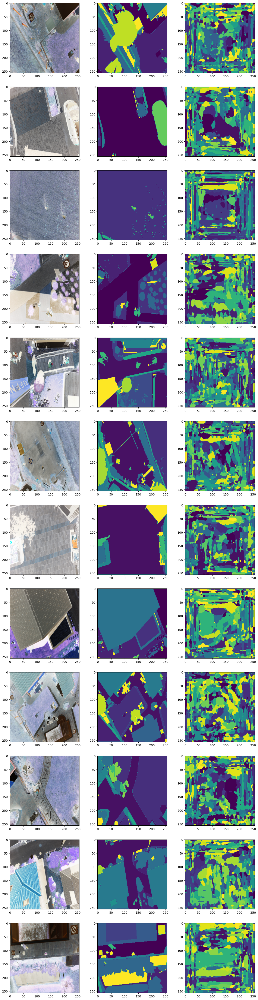

In [86]:
with torch.no_grad():
    img_x, img_y, pred = [], [], []
    k = 0
    for x, y in test_dataset:
        img_x.append(to_pil_image(x))
        img_y.append(y.argmax(0).numpy())
        pred.append(rn50(pretransforms(x).to(1).unsqueeze(0))['out'].squeeze(0).argmax(0).to('cpu').numpy())

        if k > 10:
            break
        else:
            k += 1

    f, a = plt.subplots(len(img_x), 3, figsize=(15, 5*len(img_x)))
    for i, (x_i, y_i, p_i) in enumerate(zip(img_x, img_y, pred)):
        a[i, 0].imshow(x_i)
        a[i, 1].imshow(y_i)
        a[i, 2].imshow(p_i)


In [87]:
save_train_res(rn50, train_process)

In [90]:
img_y, pred = [], []
k = 0
for x, y in test_dataset:
    img_y.append(y.unsqueeze(0))
    pred.append(rn50(x.to(0).unsqueeze(0))['out'])
yt = torch.cat(img_y, 0)
yp = torch.cat(pred, 0)

In [92]:

def eval_step(engine, batch):
    return batch

default_evaluator = Engine(eval_step)
cm = ConfusionMatrix(num_classes=24)
metric = IoU(cm)
metric.attach(default_evaluator, 'iou')

state = default_evaluator.run([[yp.reshape(-1, 24).to(0), yt.argmax(1).reshape(-1).to(0)]])
print(state.metrics['iou'])

tensor([0.0003, 0.0000, 0.0000, 0.0706, 0.0395, 0.0000, 0.0000, 0.0000, 0.0076,
        0.0000, 0.0000, 0.0053, 0.0005, 0.0000, 0.0000, 0.0000, 0.0009, 0.0000,
        0.0000, 0.0124, 0.0135, 0.0000, 0.0000, 0.0000], dtype=torch.float64)


In [93]:
pd.DataFrame({'Cluster': clusters.index, 'Value': state.metrics['iou']})

,Cluster,Value
0,unlabeled,0.000257
1,paved-area,0.000000
2,dirt,0.000000
3,grass,0.070585
4,gravel,0.039485
5,water,0.000000
6,rocks,0.000000
7,pool,0.000000
8,vegetation,0.007589
9,roof,0.000000
